In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
import numpy as np
import os
from glob import glob
import itertools
import fnmatch
import random
import matplotlib.pylab as plt
import seaborn as sns
import cv2
# from scipy.misc import imresize, imread
import sklearn
from sklearn import model_selection
from sklearn.model_selection import train_test_split, KFold, cross_val_score, StratifiedKFold, learning_curve, GridSearchCV
from sklearn.metrics import confusion_matrix, make_scorer, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
import keras
from keras import backend as K
from keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
from keras.models import Sequential, model_from_json
from keras.optimizers import SGD, RMSprop, Adam, Adagrad, Adadelta
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization, Conv2D, MaxPool2D, MaxPooling2D
%matplotlib inline

In [4]:
imagePatches = glob('/content/drive/MyDrive/BC-Data/**/*.png', recursive=True)
for filename in imagePatches[0:10]:
    print(filename)

/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x501_y801_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1651_y851_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1451_y451_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1801_y1101_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1301_y601_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x451_y551_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1251_y601_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1651_y801_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1551_y401_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x601_y701_class0.png


***Data Preprocesing***

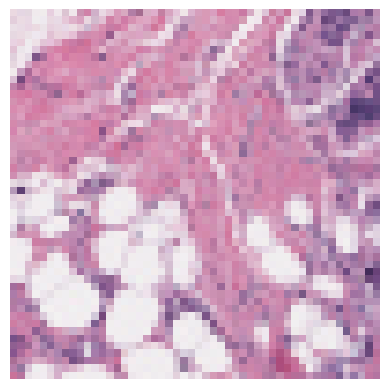

In [5]:
image_name = "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8865/1/8865_idx5_x1701_y551_class1.png"
def plotImage(image_location):
    image = cv2.imread(image_name)
    image = cv2.resize(image, (50,50))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)); plt.axis('off')
    return
plotImage(image_name)

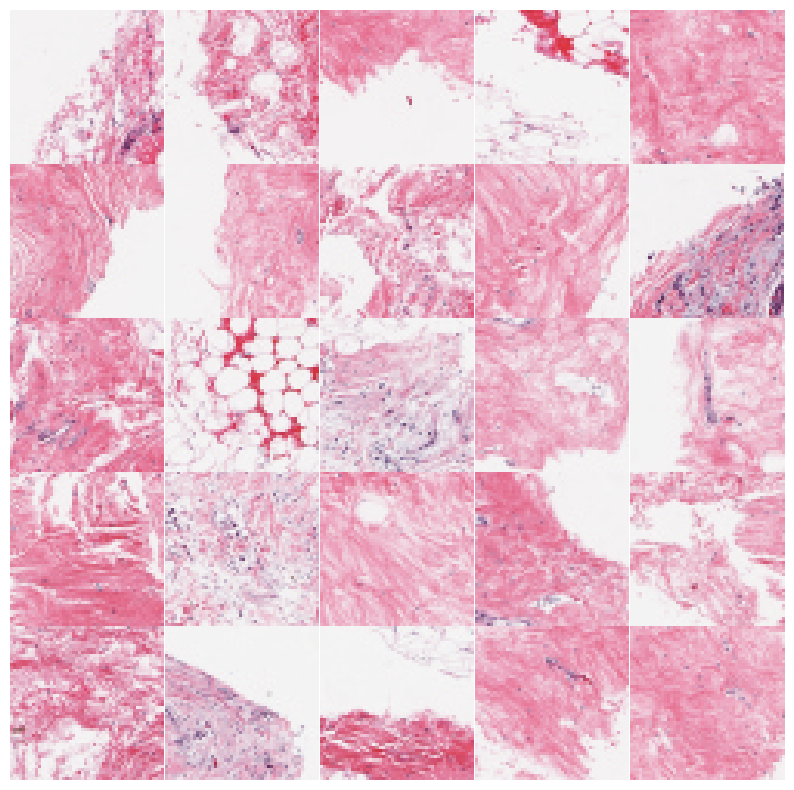

In [6]:
# Plot Multiple Images
bunchOfImages = imagePatches
i_ = 0
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.subplots_adjust(wspace=0, hspace=0)
for l in bunchOfImages[:25]:
    im = cv2.imread(l)
    im = cv2.resize(im, (50, 50))
    plt.subplot(5, 5, i_+1) #.set_title(l)
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB)); plt.axis('off')
    i_ += 1

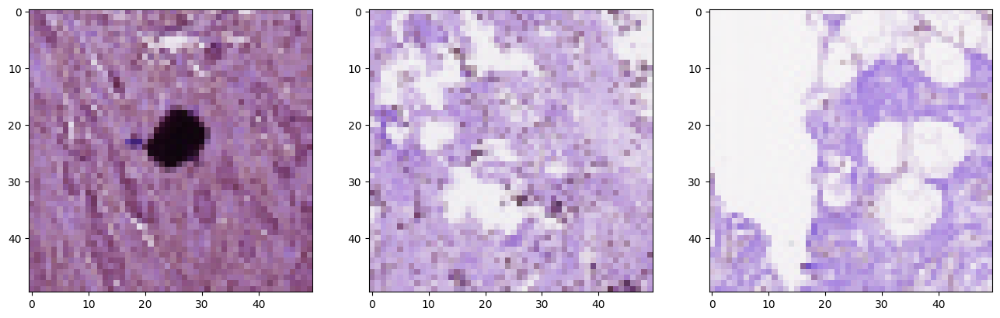

In [7]:
def randomImages(a):
    r = random.sample(a, 4)
    plt.figure(figsize=(16,16))
    plt.subplot(131)
    plt.imshow(cv2.imread(r[0]))
    plt.subplot(132)
    plt.imshow(cv2.imread(r[1]))
    plt.subplot(133)
    plt.imshow(cv2.imread(r[2]));
randomImages(imagePatches)

In [8]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
data_folder = '/content/drive/MyDrive/BC-Data/'
label0_folder = os.path.join(data_folder, '0/*class0.png')
label1_folder = os.path.join(data_folder, '1/*class1.png')

In [9]:
data_folder = '/content/drive/MyDrive/BC-Data/'
patternZero = "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/*.png"
patternOne = "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/1/*.png"
classZero = fnmatch.filter(imagePatches, patternZero)
classOne = fnmatch.filter(imagePatches, patternOne)

In [10]:
import fnmatch
import glob

data_folder = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/'

# Define the patterns to match for class 0 and class 1
patternZero = "0/*.png"
patternOne = "1/*.png"

# Get the image paths for class 0 and class 1
classZero = glob.glob(data_folder + patternZero)
classOne = glob.glob(data_folder + patternOne)

# Print the image paths
print("Class 0 images:")
for image_path0 in classZero:
    print(image_path0)

print("Class 1 images:")
for image_path1 in classOne:
    print(image_path1)


Class 0 images:
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1051_y1201_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1801_y2151_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x2651_y1151_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1301_y101_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1451_y151_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1351_y951_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x2601_y1151_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1951_y1651_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1651_y1101_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1201_y1901_class0.png
/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863

***Image Enhancement***

In [11]:
def enhance_image(image):
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    l_channel, a_channel, b_channel = cv2.split(lab_image)
    enhanced_l_channel = cv2.equalizeHist(l_channel)
    enhanced_lab_image = cv2.merge((enhanced_l_channel, a_channel, b_channel))
    enhanced_image = cv2.cvtColor(enhanced_lab_image, cv2.COLOR_Lab2BGR)
    return enhanced_image


In [12]:
class0_images = []
for image_path in classZero:
    if image_path.endswith('.png'):
        image = cv2.imread(image_path)
        enhanced_image = enhance_image(image)
        class0_images.append(enhanced_image)

class1_images = []
for image_path in classOne:
    if image_path.endswith('.png'):
        image = cv2.imread(image_path)
        enhanced_image = enhance_image(image)
        class1_images.append(enhanced_image)

In [13]:
desired_width = 224
desired_height = 224
class0_images = []
for image_path in classZero:
    if image_path.endswith('.png'):
        image = cv2.imread(image_path)
        enhanced_image = enhance_image(image)
        resized_image = cv2.resize(enhanced_image, (desired_width, desired_height))
        class0_images.append(resized_image)
class1_images = []
for image_path in classOne:
    if image_path.endswith('.png'):
        image = cv2.imread(image_path)
        enhanced_image = enhance_image(image)
        resized_image = cv2.resize(enhanced_image, (desired_width, desired_height))
        class1_images.append(resized_image)

In [14]:
class0_images = np.array(class0_images)
class1_images = np.array(class1_images)
all_images = np.concatenate((class0_images, class1_images), axis=0)
labels = np.concatenate((np.zeros(class0_images.shape[0]), np.ones(class1_images.shape[0])), axis=0)
X_train, X_test, y_train, y_test = train_test_split(all_images, labels, test_size=0.2, random_state=42)
train_folder = os.path.join(data_folder, 'train')
test_folder = os.path.join(data_folder, 'test')
os.makedirs(train_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

***Training Data***

In [15]:
for i, image in enumerate(X_train):
    label = int(y_train[i])
    label_folder = os.path.join(train_folder, f'label_{label}')
    os.makedirs(label_folder, exist_ok=True)
    image_path = os.path.join(label_folder, f'image_{i}.png')
    cv2.imwrite(image_path, image)

***Testing Data***

In [16]:
for i, image in enumerate(X_test):
    label = int(y_test[i])
    label_folder = os.path.join(test_folder, f'label_{label}')
    os.makedirs(label_folder, exist_ok=True)
    image_path = os.path.join(label_folder, f'image_{i}.png')
    cv2.imwrite(image_path, image)

In [17]:
print(class0_images.shape)
print(class1_images.shape)

(508, 224, 224, 3)
(207, 224, 224, 3)


***Segmented Images***

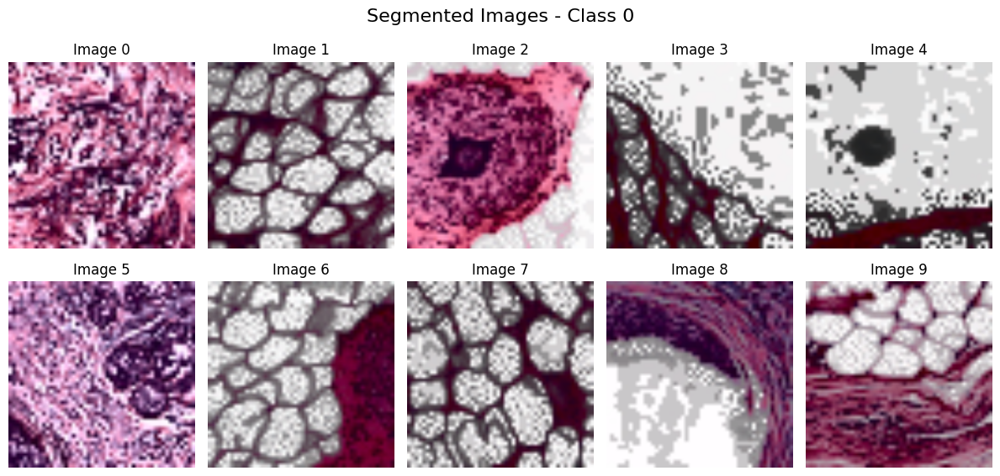

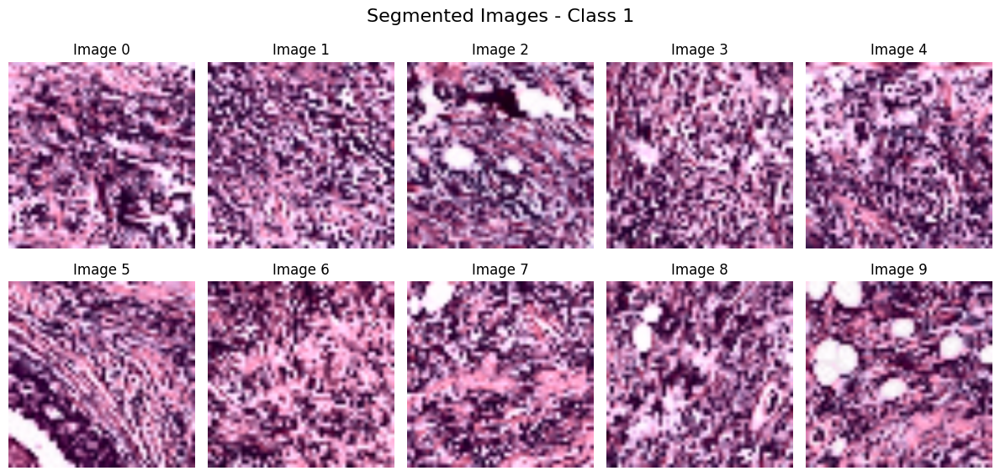

In [18]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 5, figsize=(12, 6))
fig.suptitle('Segmented Images - Class 0', fontsize=16)
for i, ax in enumerate(axs.flat):
    ax.imshow(cv2.cvtColor(class0_images[i], cv2.COLOR_BGR2RGB))
    ax.set_title(f'Image {i}')
    ax.axis('off')
plt.tight_layout()
plt.show()
fig, axs = plt.subplots(2, 5, figsize=(12, 6))
fig.suptitle('Segmented Images - Class 1', fontsize=16)
for i, ax in enumerate(axs.flat):
    ax.imshow(cv2.cvtColor(class1_images[i], cv2.COLOR_BGR2RGB))
    ax.set_title(f'Image {i}')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [19]:
print("Number of class 0 images:", class0_images.shape[0])
print("Number of class 1 images:", class1_images.shape[0])
print("Total number of images:", all_images.shape[0])
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Number of class 0 images: 508
Number of class 1 images: 207
Total number of images: 715
Shape of X_train: (572, 224, 224, 3)
Shape of X_test: (143, 224, 224, 3)
Shape of y_train: (572,)
Shape of y_test: (143,)


In [20]:
IMAGE_SIZE = 96
IMAGE_CHANNELS = 3

SAMPLE_SIZE = 17000

In [21]:
print(len(os.listdir('/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/')))
print(len(os.listdir('/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/test/')))

2
2


In [22]:
folder_train = "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/"
folder_test = "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/test/"

this is class 0 Image: 


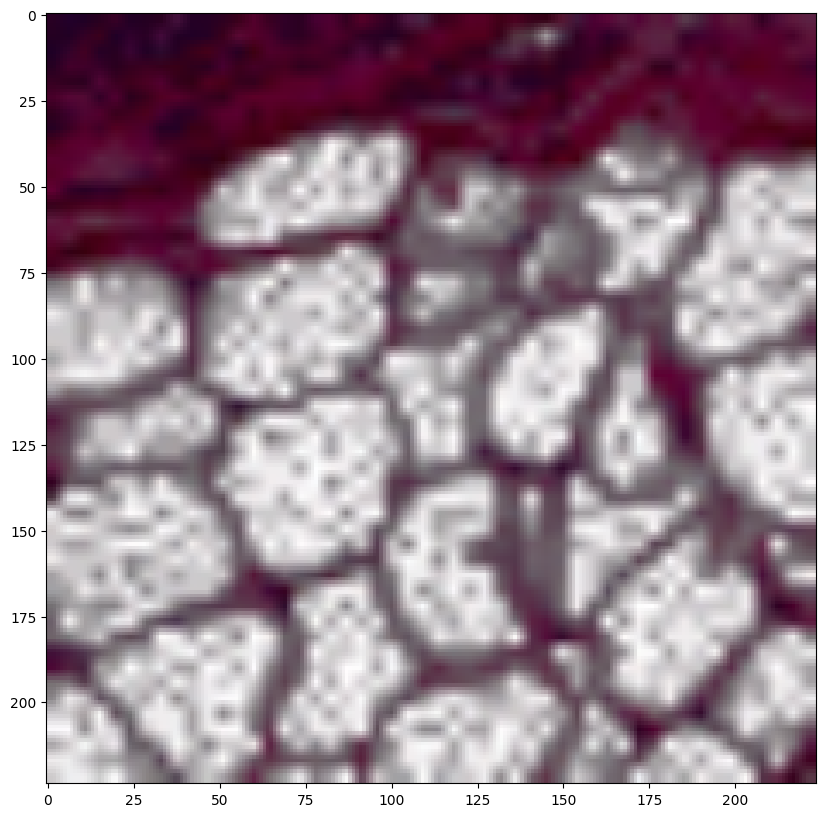

In [23]:
import math
print("this is class 0 Image: ")
image = plt.imread("/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_0/image_100.png")
plt.imshow(image)

In [24]:
directory = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/'

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


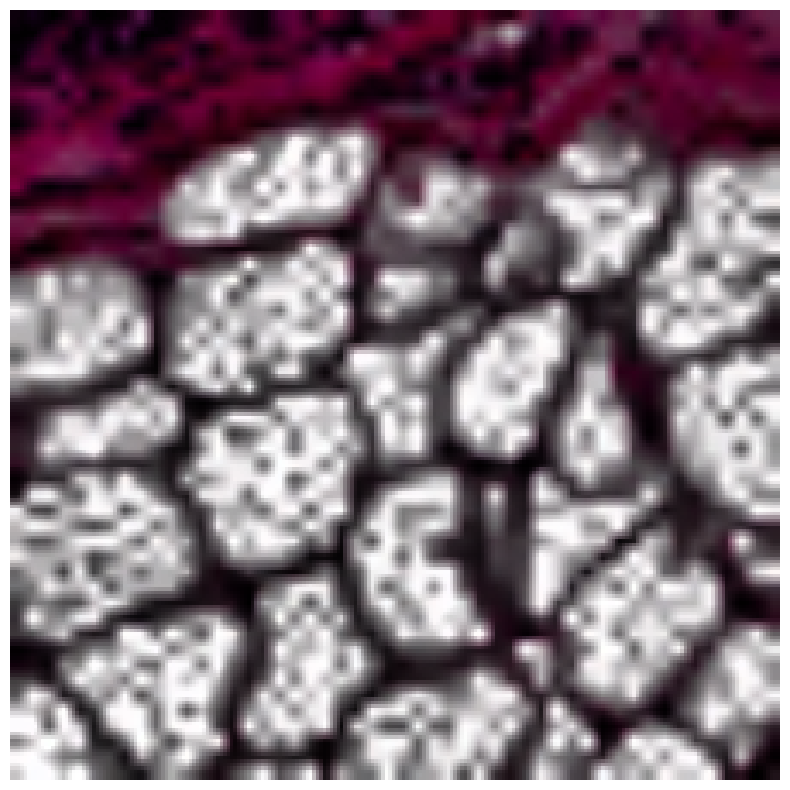

In [25]:
import numpy as np
from skimage import io, exposure, filters
image = plt.imread("/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_0/image_100.png")
equalized_image = exposure.equalize_hist(image)
adaped_image = exposure.equalize_adapthist(image)
amount = 1.0
plt.imshow(adaped_image, cmap='gray')
plt.axis('off')
plt.show()

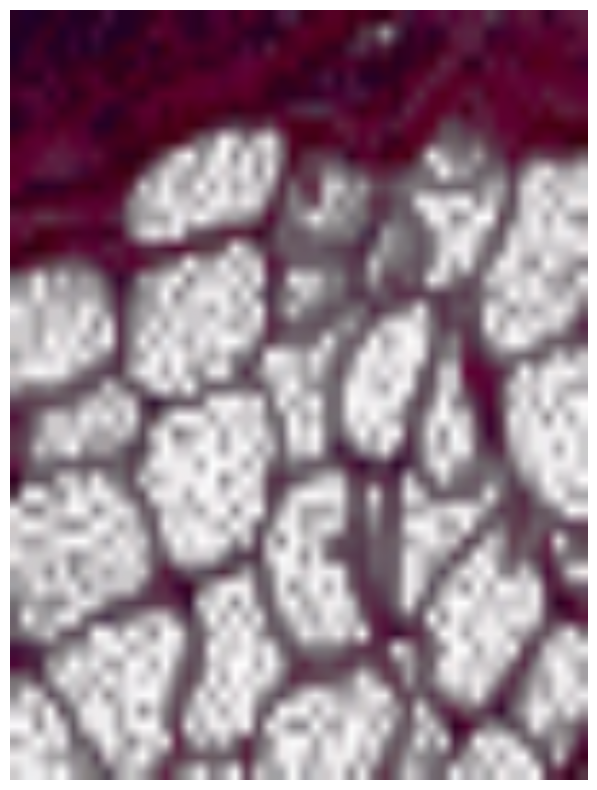

In [26]:
import numpy as np
from skimage import io, transform

image = io.imread("/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_0/image_100.png")
width = 800
height = 600

new_size = (width, height)


resized_image = transform.resize(image, new_size)

io.imsave("/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_0/image_100.png", resized_image)

plt.imshow(resized_image, cmap='gray')
plt.axis('off')
plt.show()

***ROI Extraction and Enhancement***

In [27]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from torch.utils.data import Dataset,DataLoader,random_split

In [28]:
from albumentations import (HorizontalFlip, VerticalFlip,
                            ShiftScaleRotate, Normalize, Resize,
                            Compose, GaussNoise)

In [29]:
import fnmatch
import glob

data_folder = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/'

patternZero = "train/*.png"
patternOne = "test/*.png"

classZero = glob.glob(data_folder + patternZero)
classOne = glob.glob(data_folder + patternOne)


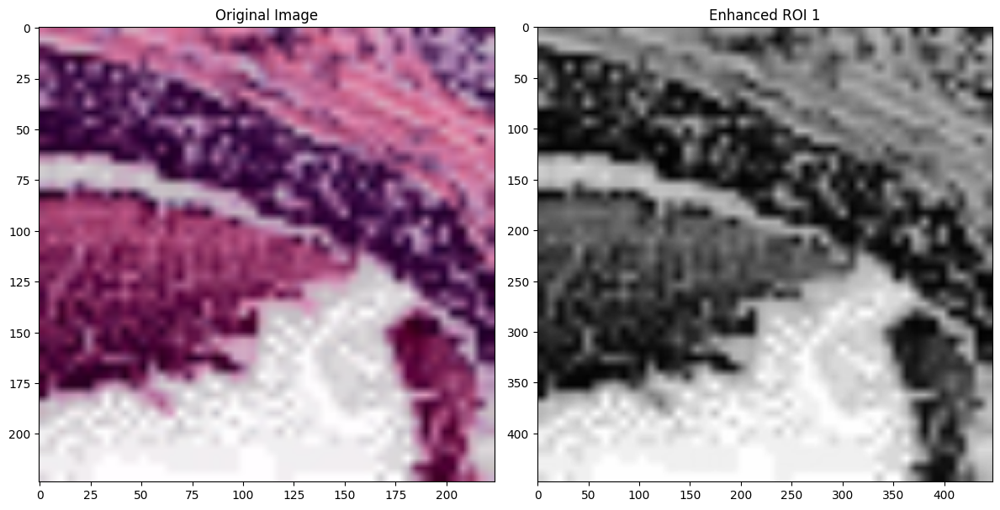

In [30]:
import cv2
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt

def enhance_image(image):
    temp_filename = "temp.png"
    image.save(temp_filename, 'PNG')
    ela_image = Image.open(temp_filename)
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    ela_image = ela_image.convert('L')
    os.remove(temp_filename)
    return ela_image

def extract_rois(image, segmented_image):

    _, binary_image = cv2.threshold(segmented_image, 0, 255, cv2.THRESH_BINARY)


    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    rois = []


    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        roi = image[y:y+h, x:x+w]
        rois.append(roi)

    return rois


image_path = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_0/image_1.png'
segmented_image_path ='/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_1/image_101.png'


image = cv2.imread(image_path)
segmented_image = cv2.imread(segmented_image_path, 0)  # Load as grayscale

rois = extract_rois(image, segmented_image)

fig, axes = plt.subplots(1, min(len(rois) + 1, 11), figsize=(12, 6))

axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')

for i, roi in enumerate(rois[:10]):
    enhanced_roi = enhance_image(Image.fromarray(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)))
    enhanced_roi = enhanced_roi.resize((roi.shape[1] * 2, roi.shape[0] * 2))  # Resize the image
    axes[i+1].imshow(enhanced_roi, cmap='gray')
    axes[i+1].set_title('Enhanced ROI {}'.format(i+1))
plt.tight_layout()
plt.show()

In [31]:
import cv2
import numpy as np

def extract_dct_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    resized_image = cv2.resize(gray, (256, 256))
    dct = cv2.dct(np.float32(resized_image))
    features = dct.flatten()

    return features

image_path = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_1/image_131.png'

roi = cv2.imread(image_path)

dct_features = extract_dct_features(roi)

***AlexNet Model***

In [32]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image

def extract_alexnet_features(image):
    model = models.alexnet(pretrained=True)

    model.eval()

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    input_image = transform(image).unsqueeze(0)

    features = model.features(input_image)

    features = torch.flatten(features, start_dim=1)

    return features.detach().numpy()

image_path = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/1/8863_idx5_x1001_y1551_class1.png'

roi = Image.open(image_path)

alexnet_features = extract_alexnet_features(roi)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 94.7MB/s]


In [33]:
import torch
import torchvision.models as models

model = models.alexnet(pretrained=True)

model.eval()


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

***Discrete Cosine Transform (DCT) ***

In [34]:
import torchvision.transforms as transforms
from PIL import Image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_path = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_1/image_131.png'
image = Image.open(image_path)
input_image = transform(image).unsqueeze(0)

In [35]:
features = model.features(input_image)

features = torch.flatten(features, start_dim=1)

features = features.detach().numpy()

In [36]:
patternZero = '*class0.png'
patternOne = '*class1.png'
classZero = fnmatch.filter(imagePatches, patternZero)
classOne = fnmatch.filter(imagePatches, patternOne)
print("IDC(-)\n\n",classZero[0:5],'\n')
print("IDC(+)\n\n",classOne[0:5])

IDC(-)

 ['/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x501_y801_class0.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1651_y851_class0.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1451_y451_class0.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1801_y1101_class0.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/0/9044_idx5_x1301_y601_class0.png'] 

IDC(+)

 ['/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/1/9044_idx5_x851_y1351_class1.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/1/9044_idx5_x751_y551_class1.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/1/9044_idx5_x801_y1251_class1.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/1/9044_idx5_x751_y651_class1.png', '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/9044/1/9044_idx5_x801_y1301_class1.png']


In [37]:
def proc_images(lowerIndex,upperIndex):
    x = []
    y = []
    WIDTH = 50
    HEIGHT = 50
    for img in imagePatches[lowerIndex:upperIndex]:
        full_size_image = cv2.imread(img)
        x.append(cv2.resize(full_size_image, (WIDTH,HEIGHT), interpolation=cv2.INTER_CUBIC))
        if img in classZero:
            y.append(0)
        elif img in classOne:
            y.append(1)
        else:
            return
    return x,y

In [38]:
X,Y = proc_images(0,10000)
df = pd.DataFrame()
df["images"]=X
df["labels"]=Y
X2=df["images"]
Y2=df["labels"]
X2=np.array(X2)
imgs0=[]
imgs1=[]
imgs0 = X2[Y2==0]
imgs1 = X2[Y2==1]

In [39]:
def describeData(a,b):
    print('Total number of images: {}'.format(len(a)))
    print('Number of IDC(-) Images: {}'.format(np.sum(b==0)))
    print('Number of IDC(+) Images: {}'.format(np.sum(b==1)))
    print('Percentage of positive images: {:.2f}%'.format(100*np.mean(b)))
    print('Image shape (Width, Height, Channels): {}'.format(a[0].shape))
describeData(X2,Y2)

Total number of images: 10000
Number of IDC(-) Images: 6576
Number of IDC(+) Images: 3424
Percentage of positive images: 34.24%
Image shape (Width, Height, Channels): (50, 50, 3)


In [40]:
dict_characters = {0: 'IDC(-)', 1: 'IDC(+)'}
print(df.head(10))
print("")
print(dict_characters)

                                              images  labels
0  [[[243, 243, 244], [243, 243, 244], [243, 242,...       0
1  [[[242, 242, 244], [246, 241, 247], [244, 241,...       0
2  [[[145, 115, 230], [154, 125, 230], [164, 131,...       0
3  [[[245, 244, 245], [244, 240, 245], [229, 223,...       0
4  [[[156, 124, 229], [155, 122, 227], [154, 123,...       0
5  [[[174, 142, 232], [168, 142, 230], [175, 147,...       0
6  [[[244, 243, 244], [243, 243, 244], [243, 242,...       0
7  [[[238, 237, 242], [244, 241, 245], [241, 241,...       0
8  [[[172, 144, 236], [176, 146, 233], [178, 151,...       0
9  [[[241, 241, 244], [243, 244, 244], [243, 243,...       0

{0: 'IDC(-)', 1: 'IDC(+)'}


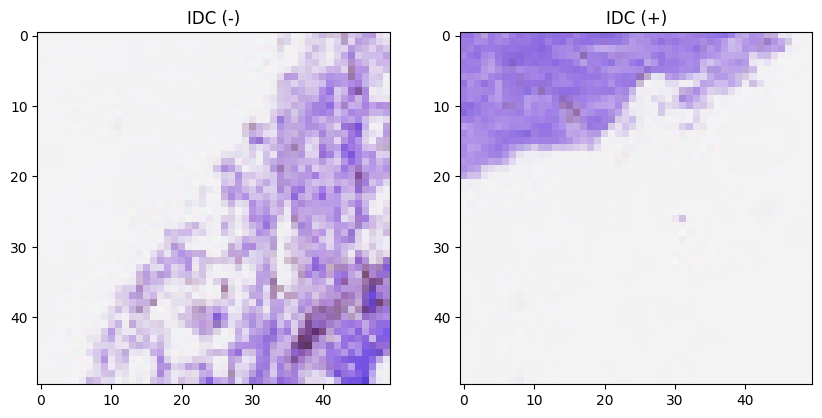

In [41]:
def plotOne(a,b):
    plt.subplot(1,2,1)
    plt.title('IDC (-)')
    plt.imshow(a[0])
    plt.subplot(1,2,2)
    plt.title('IDC (+)')
    plt.imshow(b[0])
plotOne(imgs0, imgs1)

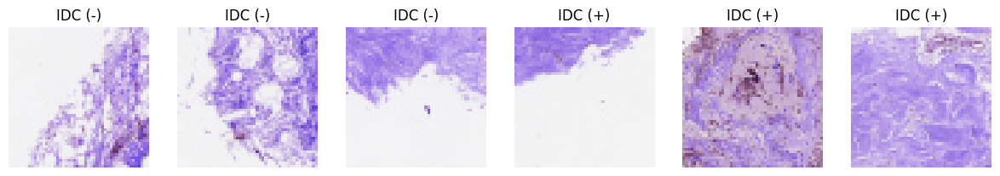

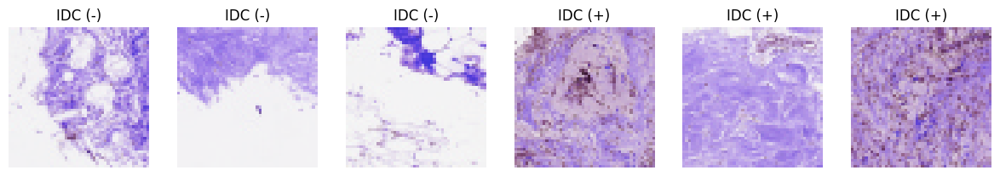

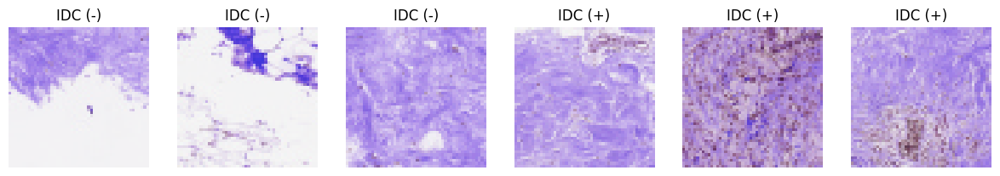

In [42]:
def plotTwo(a,b):
    for row in range(3):
        plt.figure(figsize=(20, 10))
        for col in range(3):
            plt.subplot(1,8,col+1)
            plt.title('IDC (-)')
            plt.imshow(a[0+row+col])
            plt.axis('off')
            plt.subplot(1,8,col+4)
            plt.title('IDC (+)')
            plt.imshow(b[0+row+col])
            plt.axis('off')
plotTwo(imgs0, imgs1)

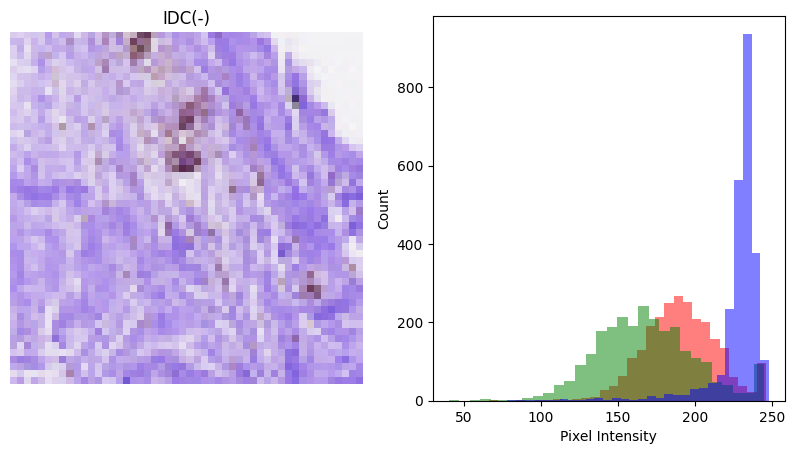

In [43]:
def plotHistogram(a):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(a)
    plt.axis('off')
    plt.title('IDC(+)' if Y[1] else 'IDC(-)')
    histo = plt.subplot(1,2,2)
    histo.set_ylabel('Count')
    histo.set_xlabel('Pixel Intensity')
    n_bins = 30
    plt.hist(a[:,:,0].flatten(), bins= n_bins, lw = 0, color='r', alpha=0.5);
    plt.hist(a[:,:,1].flatten(), bins= n_bins, lw = 0, color='g', alpha=0.5);
    plt.hist(a[:,:,2].flatten(), bins= n_bins, lw = 0, color='b', alpha=0.5);
plotHistogram(X2[100])

In [44]:
X=np.array(X)
X=X/255.0

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

# Reduce Sample Size for DeBugging
X_train = X_train[0:10000]
Y_train = Y_train[0:10000]
X_test = X_test[0:10000]
Y_test = Y_test[0:10000]

print("Training Data Shape:", X_train.shape)
print("Testing Data Shape:", X_test.shape)

Training Data Shape: (8000, 50, 50, 3)
Testing Data Shape: (2000, 50, 50, 3)


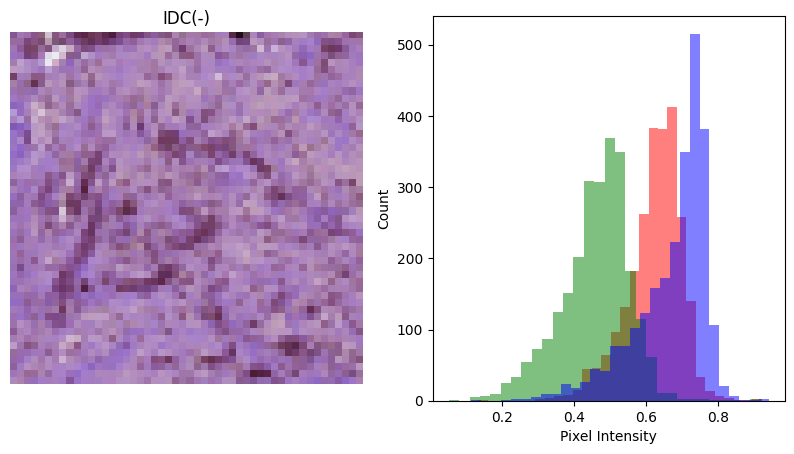

In [45]:
plotHistogram(X_train[100])

In [46]:
from sklearn.preprocessing import OneHotEncoder
Y_train = np.array(Y_train)
Y_test = np.array(Y_test)
encoder = OneHotEncoder(categories='auto', sparse=False)
Y_train_encoded = encoder.fit_transform(Y_train.reshape(-1, 1))
Y_test_encoded = encoder.transform(Y_test.reshape(-1, 1))

print("Training Labels Shape:", Y_train_encoded.shape)
print("Testing Labels Shape:", Y_test_encoded.shape)

Training Labels Shape: (8000, 2)
Testing Labels Shape: (2000, 2)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


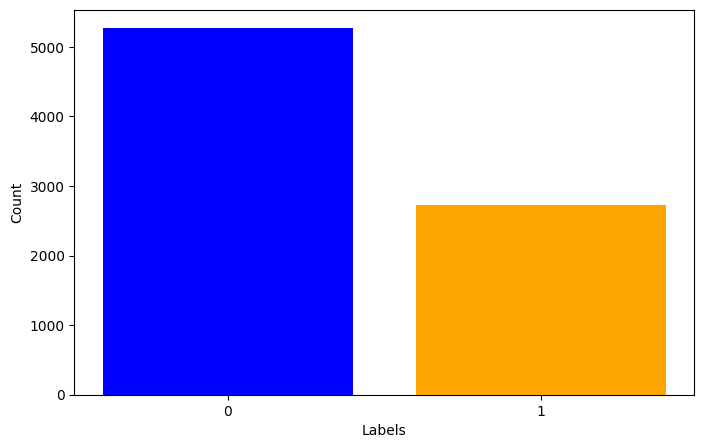

In [47]:
import matplotlib.pyplot as plt
label_counts = [sum(Y_train_encoded[:, 0]), sum(Y_train_encoded[:, 1])]
colors = ['blue', 'orange']
labels = ['0', '1']
# Set the figure size
plt.figure(figsize=(8, 5))
plt.bar(labels, label_counts, color=colors)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.show()


In [48]:
from imblearn.under_sampling import RandomUnderSampler

In [49]:
X_trainShape = X_train.shape[1]*X_train.shape[2]*X_train.shape[3]
X_testShape = X_test.shape[1]*X_test.shape[2]*X_test.shape[3]
X_trainFlat = X_train.reshape(X_train.shape[0], X_trainShape)
X_testFlat = X_test.reshape(X_test.shape[0], X_testShape)


from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler()
X_trainRos, Y_trainRos = ros.fit_resample(X_trainFlat, Y_train)
X_testRos, Y_testRos = ros.fit_resample(X_testFlat, Y_test)

Y_trainRosHot = to_categorical(Y_trainRos, num_classes = 2)
Y_testRosHot = to_categorical(Y_testRos, num_classes = 2)


for i in range(len(X_trainRos)):
    height, width, channels = 50,50,3
    X_trainRosReshaped = X_trainRos.reshape(len(X_trainRos),height,width,channels)
print("X_trainRos Shape: ",X_trainRos.shape)
print("X_trainRosReshaped Shape: ",X_trainRosReshaped.shape)

for i in range(len(X_testRos)):
    height, width, channels = 50,50,3
    X_testRosReshaped = X_testRos.reshape(len(X_testRos),height,width,channels)



X_trainRos Shape:  (5458, 7500)
X_trainRosReshaped Shape:  (5458, 50, 50, 3)


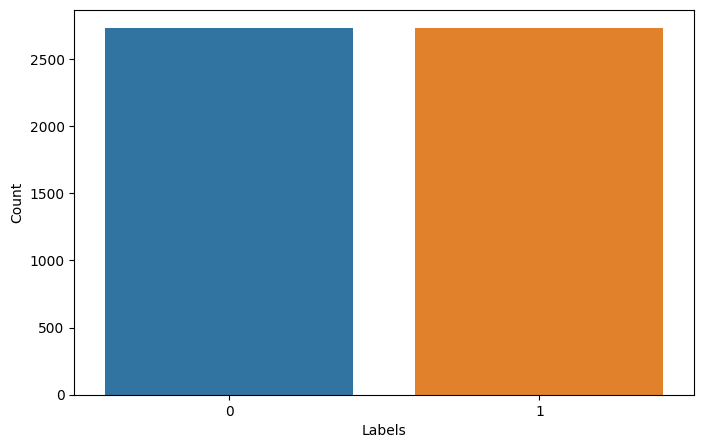

In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
height, width, channels = 50, 50, 3
X_trainRosReshaped = X_trainRos.reshape(len(X_trainRos), height, width, channels)
X_testRosReshaped = X_testRos.reshape(len(X_testRos), height, width, channels)

# Create a dataframe with labels
dfRos = pd.DataFrame()
dfRos["labels"] = Y_trainRos

# Set the figure size
plt.figure(figsize=(8, 5))

# Plot the bar graph
sns.countplot(data=dfRos, x="labels")
plt.xlabel('Labels')
plt.ylabel('Count')
plt.show()


In [51]:
import numpy as np
from sklearn.utils import class_weight

class_labels = np.unique(Y_train)
class_frequencies = np.bincount(Y_train)

class_weight = len(Y_train) / (len(class_labels) * class_frequencies)
class_weight2 = len(Y_test) / (len(class_labels) * class_frequencies)
print("Class Weights:", class_weight)
print("Class Weights2:", class_weight2)

Class Weights: [0.75886928 1.46573837]
Class Weights2: [0.18971732 0.36643459]


In [52]:
class MetricsCheckpoint(Callback):
    def __init__(self, savepath):
        super(MetricsCheckpoint, self).__init__()
        self.savepath = savepath
        self.history = {}
    def on_epoch_end(self, epoch, logs=None):
        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)
        np.save(self.savepath, self.history)


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    plt.figure(figsize = (5,5))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def plot_learning_curve(history):
    plt.figure(figsize=(8,8))
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./accuracy_curve.png')

    plt.subplot(1,2,2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./loss_curve.png')

Epoch 1/20
170/170 [==============================] - 9s 45ms/step - loss: 0.7063 - accuracy: 0.5075 - val_loss: 0.6916 - val_accuracy: 0.5007
Epoch 2/20
170/170 [==============================] - 8s 45ms/step - loss: 0.7047 - accuracy: 0.5037 - val_loss: 0.6880 - val_accuracy: 0.5007
Epoch 3/20
170/170 [==============================] - 7s 43ms/step - loss: 0.7034 - accuracy: 0.4960 - val_loss: 0.6840 - val_accuracy: 0.5007
Epoch 4/20
170/170 [==============================] - 7s 42ms/step - loss: 0.6946 - accuracy: 0.5196 - val_loss: 0.6808 - val_accuracy: 0.5007
Epoch 5/20
170/170 [==============================] - 7s 41ms/step - loss: 0.6913 - accuracy: 0.5324 - val_loss: 0.6760 - val_accuracy: 0.5187
Epoch 6/20
170/170 [==============================] - 8s 44ms/step - loss: 0.6875 - accuracy: 0.5416 - val_loss: 0.6723 - val_accuracy: 0.5144
Epoch 7/20
170/170 [==============================] - 7s 43ms/step - loss: 0.6790 - accuracy: 0.5531 - val_loss: 0.6682 - val_accuracy: 0.5403

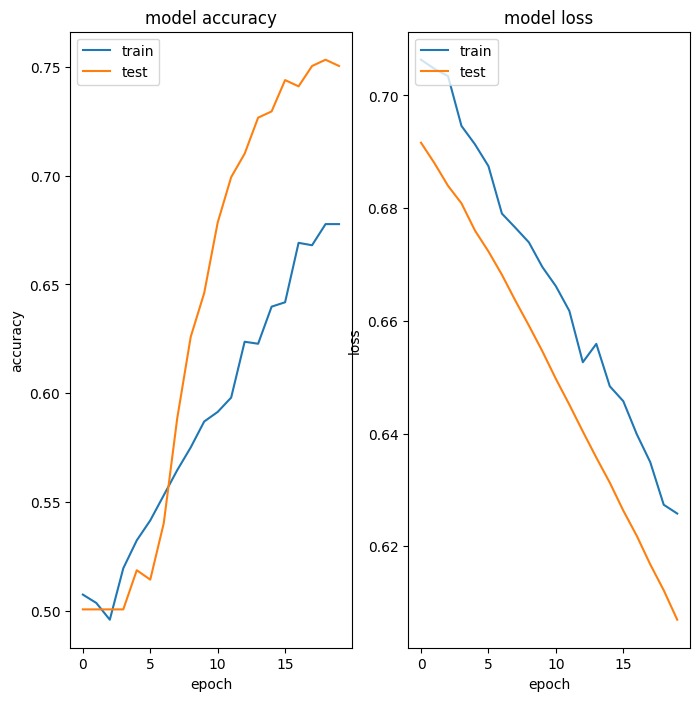

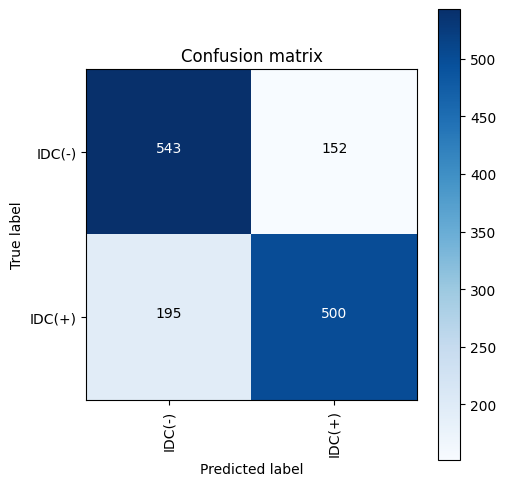

In [53]:
def runKerasCNNAugment(a,b,c,d,e,f):
    batch_size = 128
    num_classes = 2
    epochs = 20
    img_rows, img_cols = a.shape[1],a.shape[2]
    img_rows,img_cols=50,50
    input_shape = (img_rows, img_cols, 3)
    model = Sequential()
    model.add(Conv2D(32, kernel_size=(3, 3),
                     activation='relu',
                     input_shape=input_shape,strides=e))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=keras.optimizers.Adadelta(),
                  metrics=['accuracy'])
    datagen = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True,
        vertical_flip=True)

    history = model.fit(
        datagen.flow(X_trainRosReshaped, Y_trainRosHot, batch_size=32),
        steps_per_epoch=len(X_trainRosReshaped) / 32,
        epochs=epochs,
        validation_data=(X_testRosReshaped, Y_testRosHot)
    )
    score = model.evaluate(c,d, verbose=0)
    print('\nKeras CNN #1C - accuracy:', score[1],'\n')
    y_pred = model.predict(c)
    map_characters = {0: 'IDC(-)', 1: 'IDC(+)'}
    print('\n', sklearn.metrics.classification_report(np.where(d > 0)[1], np.argmax(y_pred, axis=1), target_names=list(map_characters.values())), sep='')
    Y_pred_classes = np.argmax(y_pred,axis=1)
    Y_true = np.argmax(d,axis=1)

    plt.show()
    plot_learning_curve(history)
    plt.show()
    confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
    plot_confusion_matrix(confusion_mtx, classes = list(dict_characters.values()))
    plt.show()
runKerasCNNAugment(X_trainRosReshaped, Y_trainRosHot, X_testRosReshaped, Y_testRosHot,2,class_weight2)

***ResNet50 Model***

In [54]:
import cv2
import numpy as np
from tensorflow.keras.applications import resnet
from sklearn.decomposition import PCA

In [55]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

resnet_model = ResNet50(weights='imagenet', include_top=False)

def extract_resnet_features(rois):
    features = []
    for roi in rois:
        preprocessed_roi = preprocess_input(roi)

        features_roi = resnet_model.predict(np.expand_dims(preprocessed_roi, axis=0))

        features.append(features_roi.flatten())

    return np.array(features)

94765736/94765736 [==============================] - 1s 0us/step


***Feature Extraction***

In [56]:
def extract_dct_features(rois):
    features = []
    for roi in rois:
        gray_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

        dct_roi = cv2.dct(np.float32(gray_roi))

        features.append(dct_roi.flatten())

    return np.array(features)

In [57]:
import numpy as np
roi_image = cv2.imread('/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/8863_idx5_x1001_y1001_class0.png')

roi_image = roi_image.astype(np.float32)
roi_image = roi_image / 255.0

if roi_image is None:
    print("Failed to load the image")
    exit()

if roi_image.size == 0:
    print("Invalid image size")
    exit()

roi_image_gray = cv2.cvtColor(roi_image, cv2.COLOR_RGB2GRAY)

roi_image_gray = cv2.resize(roi_image_gray, (227, 227))

dct_image = cv2.dct(roi_image_gray.astype(np.float32))

dct_features = dct_image.flatten()

normalized_features = (dct_features - np.mean(dct_features)) / np.std(dct_features)

mean_feature = np.mean(dct_features)
max_feature = np.max(dct_features)
min_feature = np.min(dct_features)

np.save('dct_features.npy', dct_features)

print(dct_features)

[ 1.1354505e+02  5.8564615e+00 -6.1093683e+00 ...  5.8649755e-05
 -6.2450621e-05 -2.9570681e-05]


In [58]:
!pip install keras

***Feature Selection***

In [59]:
print("Normalized Features:")
print(normalized_features)

print("Mean Feature:",mean_feature)
print("Max Feature:",max_feature)
print("Min Feature:",min_feature)

Normalized Features:
[ 2.1648701e+02  1.1162072e+01 -1.1652632e+01 ... -4.0653246e-03
 -4.2962208e-03 -4.2335303e-03]
Mean Feature: 0.0021908265
Max Feature: 113.54505
Min Feature: -6.8293066


In [60]:
!pip install git+https://github.com/keras-team/keras-preprocessing.git

  Cloning https://github.com/keras-team/keras-preprocessing.git to /tmp/pip-req-build-izxs9a_g
  Running command git clone --filter=blob:none --quiet https://github.com/keras-team/keras-preprocessing.git /tmp/pip-req-build-izxs9a_g
  Resolved https://github.com/keras-team/keras-preprocessing.git to commit 3e380065d4afc7347aaee8d89325a16b22158438
  Preparing metadata (setup.py) ... done
  Created wheel for Keras-Preprocessing: filename=Keras_Preprocessing-1.1.2-py3-none-any.whl size=43617 sha256=53a8e122f5bbf9705fcfa614debc6d65e9171fb720ac7ce903b091bff775a5f2
  Stored in directory: /tmp/pip-ephem-wheel-cache-ukzdevvz/wheels/72/0b/c7/3f6b26f2d789c712867e02502e1f1b740091f8615f32a9f870
Successfully built Keras-Preprocessing


***UNet Model***

In [61]:
import shutil
import cv2
import PIL
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
import tensorflow.image as tfi
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Conv2D,  MaxPool2D, UpSampling2D, concatenate, Activation
from tensorflow.keras.layers import Layer, Input, Add, Multiply, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax

import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


In [62]:
def create_data(data_dir):
    image_paths = []
    mask_paths = []
    classes = sorted(os.listdir(data_dir))

    single_mask_paths = sorted([sorted(glob.glob(data_dir + name + "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/0/*class0.png")) for name in classes])
    double_mask_paths = sorted([sorted(glob.glob(data_dir + name + "/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/1/*class1.png")) for name in classes])

    for class_path in single_mask_paths:
        for path in class_path:
            img_path = path.replace('_class0', '')
            image_paths.append(img_path)
            mask_paths.append(path)

    return image_paths, mask_paths

In [63]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image)) / 255., (SIZE, SIZE)), 4)

def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]

    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

    for i, image in enumerate(image_paths):
        img = load_image(image, SIZE)
        if mask:
            images[i] = img[:, :, :1]
        else:
            images[i] = img

    return images

In [64]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

def show_images(imgs, msks):
    plt.figure(figsize=(13,8))

    for i in range(15):
        plt.subplot(3,5,i+1)
        id = np.random.randint(len(imgs))
        show_mask(imgs[id], msks[id], cmap='binary')

    plt.tight_layout()
    plt.show()

In [65]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

In [66]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

In [67]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

In [68]:
class MyCallback(keras.callbacks.Callback):
    def __init__(self, model, epochs, ask_epoch):
        super(MyCallback, self).__init__()
        self.model = model
        self.epochs = epochs
        self.ask_epoch = ask_epoch
        self.ask_epoch_initial = ask_epoch
        self.best_epoch = 1
        self.initial_lr = float(tf.keras.backend.get_value(model.optimizer.lr))
        self.highest_tracc = 0.0
        self.lowest_vloss = np.inf
        self.best_weights = self.model.get_weights()
        self.initial_weights = self.model.get_weights()

    def on_train_begin(self, logs= None):
        msg = 'Do you want model asks you to halt the training [y/n] ?'
        print(msg)
        ans = input('')
        if ans == 'Y' or ans == 'y':
            self.ask_permission = 1
        elif ans == 'N' or ans == 'n':
            self.ask_permission = 0

        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'Duration')
        print(msg)
        self.start_time = time.time()


    def on_train_end(self, logs= None):
        stop_time = time.time()
        tr_duration = stop_time - self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)

        self.model.set_weights(self.best_weights)


    def on_train_batch_end(self, batch, logs= None):
        acc = logs.get('accuracy') * 100
        loss = logs.get('loss')

        msg = '{0:20s}processing batch {1:}  -   accuracy=  {2:5.3f}   -   loss: {3:8.5f}'.format(' ', str(batch),  acc, loss)
        print(msg, '\r', end= '')


    def on_epoch_begin(self, epoch, logs= None):
        self.ep_start = time.time()


    def on_epoch_end(self, epoch, logs= None):
        ep_end = time.time()
        duration = ep_end - self.ep_start

        acc = logs.get('accuracy')
        v_acc = logs.get('val_accuracy')
        loss = logs.get('loss')
        v_loss = logs.get('val_loss')

        print('\n')
        msg = f'{str(epoch + 1):^3s}/{str(self.epochs):4s} {loss:^9.3f}{acc * 100:^9.3f}{v_loss:^9.5f}{v_acc * 100:^9.3f}{duration:^8.2f}'
        print(msg)

        if self.ask_epoch != None and self.ask_permission != 0:
            if epoch + 1 >= self.ask_epoch:
                msg = 'enter H to halt training or an integer for number of epochs to run then ask again'
                print(msg)
                ans = input('')
                if ans == 'H' or ans == 'h':
                    msg = f'training has been halted at epoch {epoch + 1} due to user input'
                    print(msg)
                    self.model.stop_training = True
                else:
                    try:
                        ans = int(ans)
                        self.ask_epoch += ans
                        msg = f' training will continue until epoch ' + str(self.ask_epoch)
                        print(msg)
                        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'Duration')
                        print(msg)
                    except:
                        print('Invalid')

In [69]:
def plot_training(hist):
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']
    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'

    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()

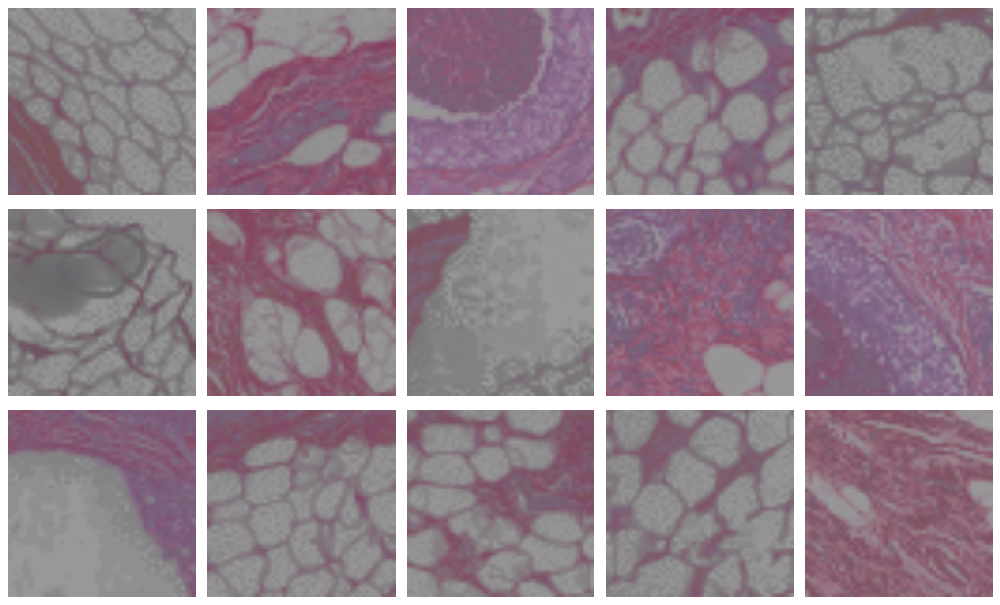

In [70]:
import numpy as np
import os
from skimage.io import imread
from skimage.transform import resize
import matplotlib.pyplot as plt
from tensorflow.keras.utils import img_to_array, load_img
SIZE = 256
def create_data(data_dir):
    image_paths = []
    mask_paths = []

    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.endswith('.png'):
                image_paths.append(os.path.join(root, file))
                mask_paths.append(os.path.join(root, file))

    return image_paths, mask_paths

data_dir = '/content/drive/MyDrive/BC-Data/IDC_regular_ps50_idx5/8863/train/label_0'
image_paths, mask_paths = create_data(data_dir)

imgs = load_images(image_paths, SIZE)
msks = load_images(mask_paths, SIZE, mask=True)

# show sample
show_images(imgs, msks)

In [71]:
input_layer = Input(shape= imgs.shape[-3:])

p1, c1 = EncoderBlock(32, 0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64, 0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128, 0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256, 0.2, name="Encoder4")(p3)

encoding = EncoderBlock(512, 0.3, pooling=False, name="Encoding")(p4)

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256, 0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128, 0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64, 0.1, name="Decoder3")([d2, a3])

a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)


model = Model(inputs= [input_layer], outputs= [output_layer])

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 Encoder1 (EncoderBlock)        ((None, 128, 128, 3  10144       ['input_2[0][0]']                
                                2),                                                               
                                 (None, 256, 256, 3                                               
                                2))                                                               
                                                                                              

In [72]:
batch_size = 40
epochs = 40
ask_epoch = 5

callbacks = [MyCallback(model= model, epochs= epochs, ask_epoch= ask_epoch )]

In [73]:
import time
import glob
import shutil
import cv2
import PIL
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
import tensorflow.image as tfi
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Conv2D,  MaxPool2D, UpSampling2D, concatenate, Activation
from tensorflow.keras.layers import Layer, Input, Add, Multiply, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax

import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


In [74]:
SPE = len(imgs)//batch_size

history = model.fit(
    imgs, msks,
    validation_split=0.2,
    epochs=epochs,
    verbose=0,
    steps_per_epoch=SPE,
    batch_size=batch_size,
    callbacks=callbacks
)

Do you want model asks you to halt the training [y/n] ?
y
 Epoch     Loss   Accuracy  V_loss    V_acc  Duration


 1 /40     2.234    0.650   0.62651   0.700   387.26 


 2 /40     0.563    0.773   0.63371   0.700   382.04 


 3 /40     0.555    0.859   0.61985   0.700   372.95 


 4 /40     0.550    0.833   0.62214   0.700   392.07 


 5 /40     0.551    0.777   0.62078   0.700   388.14 
enter H to halt training or an integer for number of epochs to run then ask again
H
training has been halted at epoch 5 due to user input
training elapsed time was 0.0 hours, 32.0 minutes, 15.76 seconds)


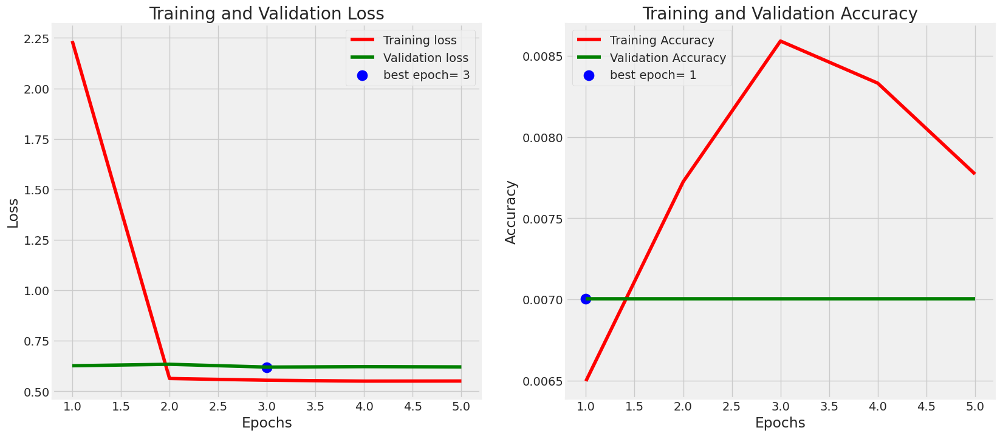

In [75]:
plot_training(history)

1/1 [==============================] - 0s 244ms/step


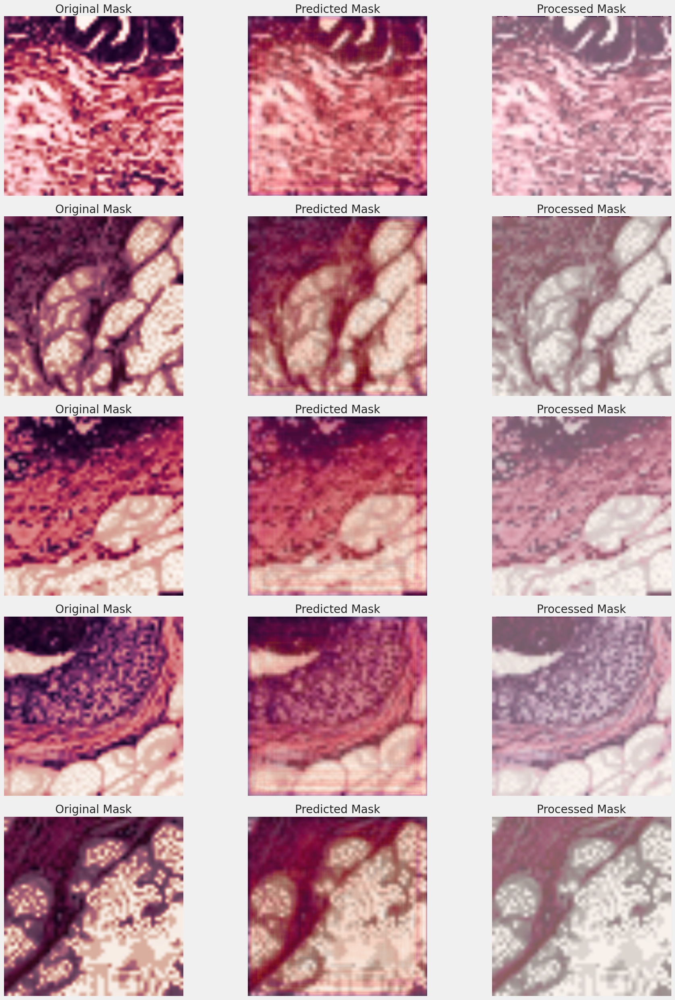

In [76]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(imgs))
        image = imgs[id]
        mask = msks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()